## Import packages

In [1]:
# Basic Imports
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
from scipy.stats import pearsonr, spearmanr

## Import data

In [2]:
dft = pd.read_csv('../assets/train.csv')
dfs = pd.read_csv('../assets/spray.csv')

## Convert date to year and week

In [3]:
dft['Date'] = pd.to_datetime(dft['Date'])
dft['Week'] = dft['Date'].dt.isocalendar().week
dft['Year'] = dft['Date'].dt.year

dfs['Date'] = pd.to_datetime(dfs['Date'])
dfs['Week'] = dfs['Date'].dt.isocalendar().week
dfs['Year'] = dfs['Date'].dt.year

In [4]:
pd.options.display.max_columns = None
pd.options.display.max_rows = None

In [5]:
dft.head()

,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent,Week,Year
0,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,9,1,0,22,2007
1,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,9,1,0,22,2007
2,2007-05-29,"6200 North Mandell Avenue, Chicago, IL 60646, USA",CULEX RESTUANS,62,N MANDELL AVE,T007,"6200 N MANDELL AVE, Chicago, IL",41.994991,-87.769279,9,1,0,22,2007
3,2007-05-29,"7900 West Foster Avenue, Chicago, IL 60656, USA",CULEX PIPIENS/RESTUANS,79,W FOSTER AVE,T015,"7900 W FOSTER AVE, Chicago, IL",41.974089,-87.824812,8,1,0,22,2007
4,2007-05-29,"7900 West Foster Avenue, Chicago, IL 60656, USA",CULEX RESTUANS,79,W FOSTER AVE,T015,"7900 W FOSTER AVE, Chicago, IL",41.974089,-87.824812,8,4,0,22,2007


In [6]:
dft['Date']

0       2007-05-29
1       2007-05-29
2       2007-05-29
3       2007-05-29
4       2007-05-29
5       2007-05-29
6       2007-05-29
7       2007-05-29
8       2007-05-29
9       2007-05-29
10      2007-05-29
11      2007-05-29
12      2007-05-29
13      2007-05-29
14      2007-05-29
15      2007-05-29
16      2007-05-29
17      2007-05-29
18      2007-05-29
19      2007-05-29
20      2007-05-29
21      2007-05-29
22      2007-05-29
23      2007-05-29
24      2007-05-29
25      2007-06-05
26      2007-06-05
27      2007-06-05
28      2007-06-05
29      2007-06-05
30      2007-06-05
31      2007-06-05
32      2007-06-05
33      2007-06-05
34      2007-06-05
35      2007-06-05
36      2007-06-05
37      2007-06-05
38      2007-06-05
39      2007-06-05
40      2007-06-05
41      2007-06-05
42      2007-06-05
43      2007-06-05
44      2007-06-05
45      2007-06-05
46      2007-06-05
47      2007-06-05
48      2007-06-05
49      2007-06-05
50      2007-06-05
51      2007-06-05
52      2007

In [7]:
dfs.head()

,Date,Time,Latitude,Longitude,Week,Year
0,2011-08-29,6:56:58 PM,42.391623,-88.089163,35,2011
1,2011-08-29,6:57:08 PM,42.391348,-88.089163,35,2011
2,2011-08-29,6:57:18 PM,42.391022,-88.089157,35,2011
3,2011-08-29,6:57:28 PM,42.390637,-88.089158,35,2011
4,2011-08-29,6:57:38 PM,42.390410,-88.088858,35,2011


In [8]:
dft.info

<bound method DataFrame.info of             Date                                            Address  \
0     2007-05-29  4100 North Oak Park Avenue, Chicago, IL 60634,...   
1     2007-05-29  4100 North Oak Park Avenue, Chicago, IL 60634,...   
2     2007-05-29  6200 North Mandell Avenue, Chicago, IL 60646, USA   
3     2007-05-29    7900 West Foster Avenue, Chicago, IL 60656, USA   
4     2007-05-29    7900 West Foster Avenue, Chicago, IL 60656, USA   
5     2007-05-29   1500 West Webster Avenue, Chicago, IL 60614, USA   
6     2007-05-29     2500 West Grand Avenue, Chicago, IL 60654, USA   
7     2007-05-29        1100 Roosevelt Road, Chicago, IL 60608, USA   
8     2007-05-29        1100 Roosevelt Road, Chicago, IL 60608, USA   
9     2007-05-29   1100 West Chicago Avenue, Chicago, IL 60642, USA   
10    2007-05-29    2100 North Stave Street, Chicago, IL 60647, USA   
11    2007-05-29    2200 North Cannon Drive, Chicago, IL 60614, USA   
12    2007-05-29    2200 North Cannon Drive, 

In [9]:
dfs.info

<bound method DataFrame.info of             Date         Time   Latitude  Longitude  Week  Year
0     2011-08-29   6:56:58 PM  42.391623 -88.089163    35  2011
1     2011-08-29   6:57:08 PM  42.391348 -88.089163    35  2011
2     2011-08-29   6:57:18 PM  42.391022 -88.089157    35  2011
3     2011-08-29   6:57:28 PM  42.390637 -88.089158    35  2011
4     2011-08-29   6:57:38 PM  42.390410 -88.088858    35  2011
5     2011-08-29   6:57:48 PM  42.390395 -88.088315    35  2011
6     2011-08-29   6:57:58 PM  42.390673 -88.088002    35  2011
7     2011-08-29   6:58:08 PM  42.391027 -88.088002    35  2011
8     2011-08-29   6:58:18 PM  42.391403 -88.088003    35  2011
9     2011-08-29   6:58:28 PM  42.391718 -88.087995    35  2011
10    2011-08-29   6:58:38 PM  42.392038 -88.087988    35  2011
11    2011-08-29   6:58:48 PM  42.392410 -88.088078    35  2011
12    2011-08-29   6:58:58 PM  42.392800 -88.088332    35  2011
13    2011-08-29   6:59:08 PM  42.393257 -88.088370    35  2011
14    20

## Data Cleaning

In [10]:
#check for duplicate posts
print("Duplicates: " + str(dft[["Latitude"]].duplicated().sum()))

#check for null entries
print('\n'+ "Null entries: " + '\n'+ str(dft.isnull().sum()))

Duplicates: 10368

Null entries: 
Date                      0
Address                   0
Species                   0
Block                     0
Street                    0
Trap                      0
AddressNumberAndStreet    0
Latitude                  0
Longitude                 0
AddressAccuracy           0
NumMosquitos              0
WnvPresent                0
Week                      0
Year                      0
dtype: int64


In [11]:
len(dft["Address"].unique().tolist())

138

In [12]:
dfs['Year'].value_counts()

2013    12626
2011     2209
Name: Year, dtype: int64

In [13]:
dfs['Week'].value_counts(dropna=False, ascending=True)

NaN       0
32     1195
34     1587
30     1607
29     2202
35     2397
33     2809
36     3038
Name: Week, dtype: Int64

In [14]:
dft['Week'].value_counts()

31    1241
28     981
33     804
34     784
32     743
30     738
38     675
29     591
37     532
35     513
26     504
39     468
36     431
23     383
25     332
24     321
40     250
27     105
22      84
41      26
Name: Week, dtype: Int64

In [15]:
dfmgroup = dft.groupby(by="Species", dropna=False)['WnvPresent'].sum()

In [16]:
dfmgroup

Species
CULEX ERRATICUS             0
CULEX PIPIENS             240
CULEX PIPIENS/RESTUANS    262
CULEX RESTUANS             49
CULEX SALINARIUS            0
CULEX TARSALIS              0
CULEX TERRITANS             0
Name: WnvPresent, dtype: int64

In [17]:
dft['Species'].value_counts()

CULEX PIPIENS/RESTUANS    4752
CULEX RESTUANS            2740
CULEX PIPIENS             2699
CULEX TERRITANS            222
CULEX SALINARIUS            86
CULEX TARSALIS               6
CULEX ERRATICUS              1
Name: Species, dtype: int64

In [18]:
dfsgroup = dfs.groupby(by="Latitude", dropna=False).sum()

In [19]:
dfsgroup

,Longitude,Week,Year
Latitude,,,
41.713925,-87.615892,34,2013
41.714005,-87.618227,34,2013
41.714042,-87.615102,34,2013
41.714098,-87.659542,29,2013
41.714112,-87.658652,29,2013
41.714123,-87.617593,34,2013
41.714192,-87.651852,29,2013
41.714213,-87.658118,29,2013
41.714268,-87.618790,34,2013


In [20]:
dftgroup = dft.groupby(by=["Address", "Year", "Week", "Block", "AddressAccuracy", "Species"], dropna=False).sum().reset_index()
dftgroup

,Address,Year,Week,Block,AddressAccuracy,Species,Latitude,Longitude,NumMosquitos,WnvPresent
0,"1000 East 67th Street, Chicago, IL 60637, USA",2007,28,10,8,CULEX PIPIENS/RESTUANS,41.773215,-87.600880,2,0
1,"1000 East 67th Street, Chicago, IL 60637, USA",2007,28,10,8,CULEX RESTUANS,41.773215,-87.600880,3,0
2,"1000 East 67th Street, Chicago, IL 60637, USA",2007,30,10,8,CULEX PIPIENS/RESTUANS,41.773215,-87.600880,7,0
3,"1000 East 67th Street, Chicago, IL 60637, USA",2007,31,10,8,CULEX PIPIENS,125.319645,-262.802640,4,0
4,"1000 East 67th Street, Chicago, IL 60637, USA",2007,31,10,8,CULEX PIPIENS/RESTUANS,125.319645,-262.802640,18,0
5,"1000 East 67th Street, Chicago, IL 60637, USA",2007,31,10,8,CULEX RESTUANS,83.546430,-175.201760,2,0
6,"1000 East 67th Street, Chicago, IL 60637, USA",2007,32,10,8,CULEX PIPIENS,41.773215,-87.600880,9,0
7,"1000 East 67th Street, Chicago, IL 60637, USA",2007,32,10,8,CULEX PIPIENS/RESTUANS,41.773215,-87.600880,18,0
8,"1000 East 67th Street, Chicago, IL 60637, USA",2007,33,10,8,CULEX PIPIENS,41.773215,-87.600880,14,0
9,"1000 East 67th Street, Chicago, IL 60637, USA",2007,33,10,8,CULEX PIPIENS/RESTUANS,41.773215,-87.600880,20,0


In [21]:
dftgroupsum = dft.groupby(by=["Address", "Year", "Week", "Block", "AddressAccuracy", "Species"], dropna=False).sum().reset_index()


In [22]:
dftgroupsum.loc[dftgroupsum['WnvPresent'] > 0, 'WnvPresent'] = dftgroupsum["NumMosquitos"]
dftgroupsum.loc[dftgroupsum['WnvPresent'] == 0, 'WnvPresent'] = 0

In [23]:
dftgroup

,Address,Year,Week,Block,AddressAccuracy,Species,Latitude,Longitude,NumMosquitos,WnvPresent
0,"1000 East 67th Street, Chicago, IL 60637, USA",2007,28,10,8,CULEX PIPIENS/RESTUANS,41.773215,-87.600880,2,0
1,"1000 East 67th Street, Chicago, IL 60637, USA",2007,28,10,8,CULEX RESTUANS,41.773215,-87.600880,3,0
2,"1000 East 67th Street, Chicago, IL 60637, USA",2007,30,10,8,CULEX PIPIENS/RESTUANS,41.773215,-87.600880,7,0
3,"1000 East 67th Street, Chicago, IL 60637, USA",2007,31,10,8,CULEX PIPIENS,125.319645,-262.802640,4,0
4,"1000 East 67th Street, Chicago, IL 60637, USA",2007,31,10,8,CULEX PIPIENS/RESTUANS,125.319645,-262.802640,18,0
5,"1000 East 67th Street, Chicago, IL 60637, USA",2007,31,10,8,CULEX RESTUANS,83.546430,-175.201760,2,0
6,"1000 East 67th Street, Chicago, IL 60637, USA",2007,32,10,8,CULEX PIPIENS,41.773215,-87.600880,9,0
7,"1000 East 67th Street, Chicago, IL 60637, USA",2007,32,10,8,CULEX PIPIENS/RESTUANS,41.773215,-87.600880,18,0
8,"1000 East 67th Street, Chicago, IL 60637, USA",2007,33,10,8,CULEX PIPIENS,41.773215,-87.600880,14,0
9,"1000 East 67th Street, Chicago, IL 60637, USA",2007,33,10,8,CULEX PIPIENS/RESTUANS,41.773215,-87.600880,20,0


In [24]:
dftgroup.dtypes

Address             object
Year                 int64
Week                 int64
Block                int64
AddressAccuracy      int64
Species             object
Latitude           float64
Longitude          float64
NumMosquitos         int64
WnvPresent           int64
dtype: object

## Spilt train data into years and weeks

In [25]:
dftgroup_plt = dft.groupby(by=["Week", "Year"], dropna=False).sum().reset_index()

dftgroup_plt2007 = dftgroup_plt[dftgroup_plt['Year']==2007] 
dftgroup_plt2009 = dftgroup_plt[dftgroup_plt['Year']==2009] 
dftgroup_plt2011 = dftgroup_plt[dftgroup_plt['Year']==2011] 
dftgroup_plt2013 = dftgroup_plt[dftgroup_plt['Year']==2013] 

In [26]:
dftgroup["NumMosquitos"].corr(dftgroup['WnvPresent'])

0.4861819265020257

In [27]:
dftgroup_plt["NumMosquitos"].corr(dftgroup_plt['WnvPresent'])

0.6543593104403344

In [28]:
dftgroupsum["NumMosquitos"].corr(dftgroupsum['WnvPresent'])

0.8535390657253619

In [29]:
dftgroup.to_csv('../assets/train_grouped')

In [30]:
dftgroup_plt

,Week,Year,Block,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent
0,22,2007,906,1046.922110,-2192.404258,198,40,0
1,22,2009,2191,2467.917011,-5173.425017,468,190,0
2,23,2007,2217,2512.953427,-5262.973680,492,127,0
3,23,2009,6012,7700.277050,-16139.695489,1495,1268,0
4,23,2011,1618,2598.944080,-5442.045375,533,429,0
5,23,2013,2895,3222.719598,-6754.286618,604,360,0
6,24,2009,3746,3893.794783,-8157.010514,776,1204,0
7,24,2011,3759,4479.528252,-9386.198230,873,830,0
8,24,2013,4453,5065.821561,-10614.788733,979,1670,0
9,25,2009,4039,5232.013018,-10963.091899,988,1046,0


In [31]:
dftgroup_plt2 = dft.groupby(by=["Week", "Year", "WnvPresent"], dropna=False).sum().reset_index()

In [32]:
dftgroup_plt2

,Week,Year,WnvPresent,Block,Latitude,Longitude,AddressAccuracy,NumMosquitos
0,22,2007,0,906,1046.922110,-2192.404258,198,40
1,22,2009,0,2191,2467.917011,-5173.425017,468,190
2,23,2007,0,2217,2512.953427,-5262.973680,492,127
3,23,2009,0,6012,7700.277050,-16139.695489,1495,1268
4,23,2011,0,1618,2598.944080,-5442.045375,533,429
5,23,2013,0,2895,3222.719598,-6754.286618,604,360
6,24,2009,0,3746,3893.794783,-8157.010514,776,1204
7,24,2011,0,3759,4479.528252,-9386.198230,873,830
8,24,2013,0,4453,5065.821561,-10614.788733,979,1670
9,25,2009,0,4039,5232.013018,-10963.091899,988,1046


In [33]:
dftgroup_plt2013['NumMosquitos'].sum()

36444

## Data Visualisation

<Figure size 1800x1800 with 0 Axes>

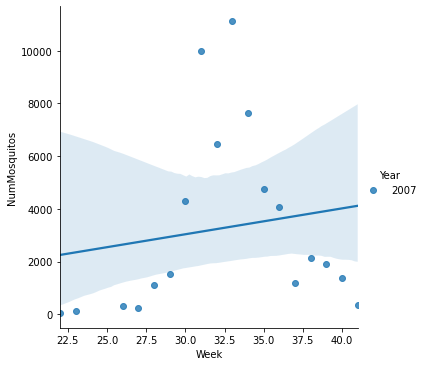

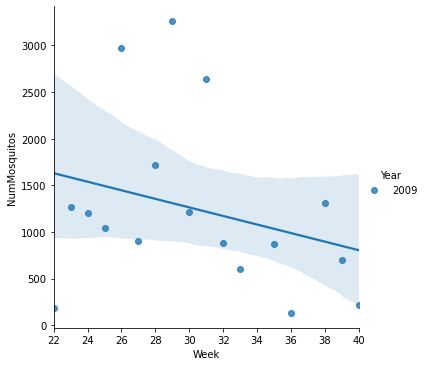

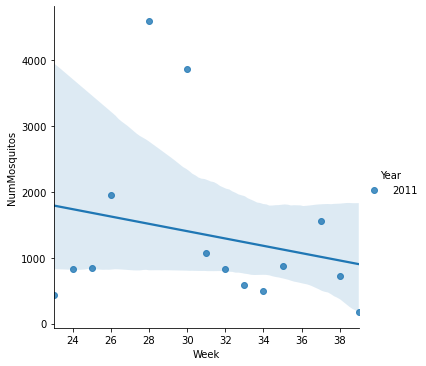

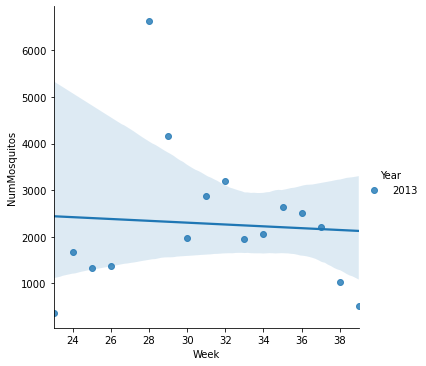

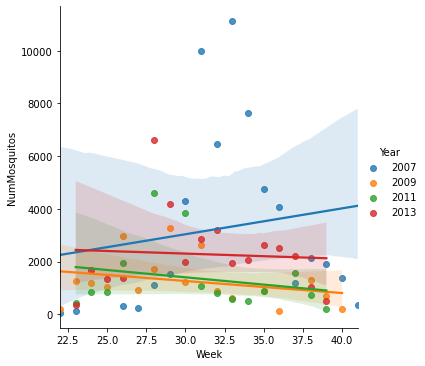

In [34]:
plt.figure(figsize=(25,25))
sns.lmplot(x='Week',y='NumMosquitos', hue='Year', data=dftgroup_plt2007);
sns.lmplot(x='Week',y='NumMosquitos', hue='Year', data=dftgroup_plt2009);
sns.lmplot(x='Week',y='NumMosquitos', hue='Year', data=dftgroup_plt2011);
sns.lmplot(x='Week',y='NumMosquitos', hue='Year', data=dftgroup_plt2013);
sns.lmplot(x='Week',y='NumMosquitos', hue='Year', data=dftgroup_plt);

Plot number of mosquitoes against years.
1) 2007 - overall increasing trend with peak around week 33

2) 2009 - decreasing trend with peak around week 30

3) 2011 - decreasing trend with peak around week 28

4) 2013 - stable trend with peak around week 29 

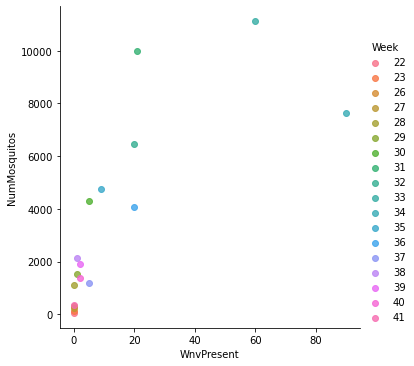

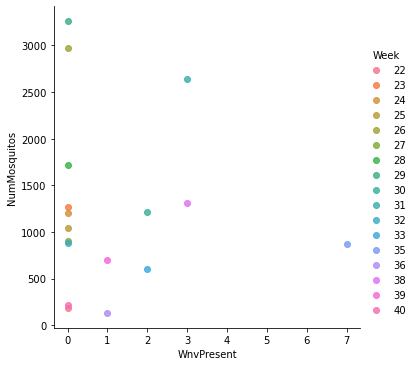

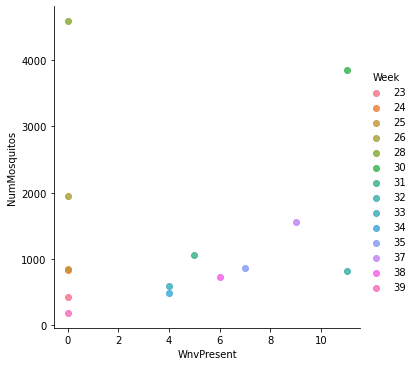

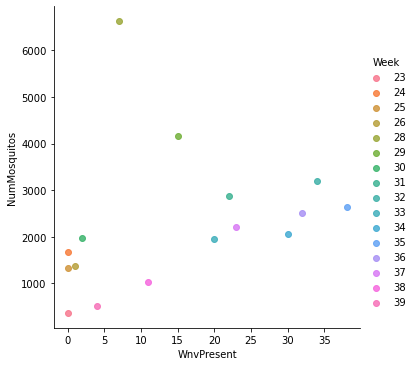

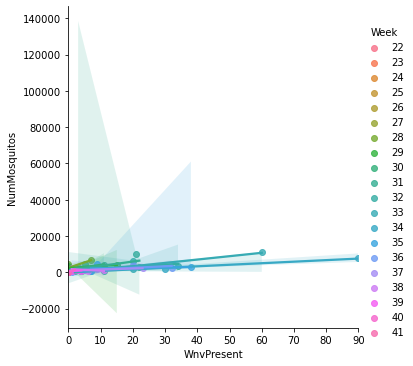

In [35]:
sns.lmplot(x='WnvPresent',y='NumMosquitos', hue='Week', data=dftgroup_plt2007);
sns.lmplot(x='WnvPresent',y='NumMosquitos', hue='Week', data=dftgroup_plt2009);
sns.lmplot(x='WnvPresent',y='NumMosquitos', hue='Week', data=dftgroup_plt2011);
sns.lmplot(x='WnvPresent',y='NumMosquitos', hue='Week', data=dftgroup_plt2013);
sns.lmplot(x='WnvPresent',y='NumMosquitos', hue='Week', data=dftgroup_plt);

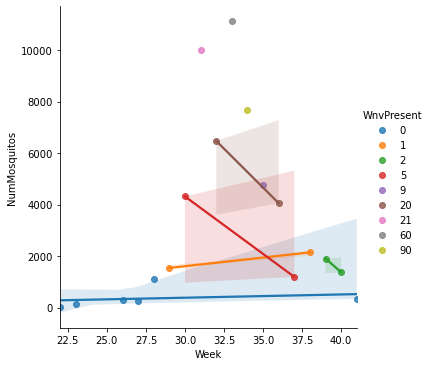

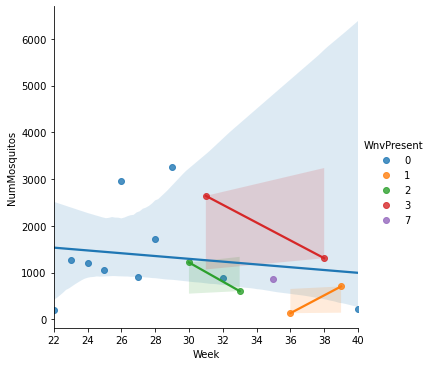

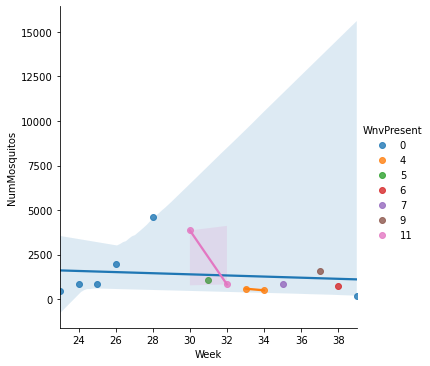

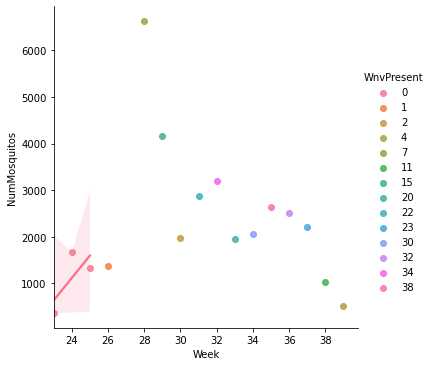

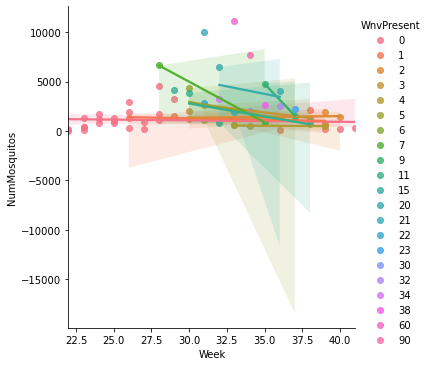

In [36]:
sns.lmplot(x='Week',y='NumMosquitos', hue='WnvPresent', data=dftgroup_plt2007);
sns.lmplot(x='Week',y='NumMosquitos', hue='WnvPresent', data=dftgroup_plt2009);
sns.lmplot(x='Week',y='NumMosquitos', hue='WnvPresent', data=dftgroup_plt2011);
sns.lmplot(x='Week',y='NumMosquitos', hue='WnvPresent', data=dftgroup_plt2013);
sns.lmplot(x='Week',y='NumMosquitos', hue='WnvPresent', data=dftgroup_plt);

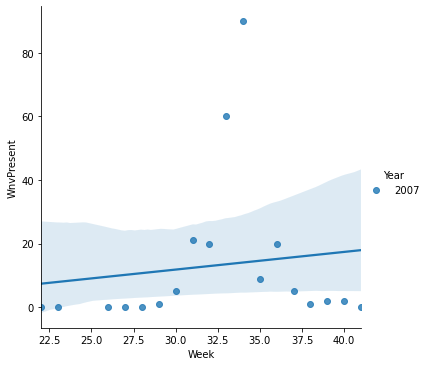

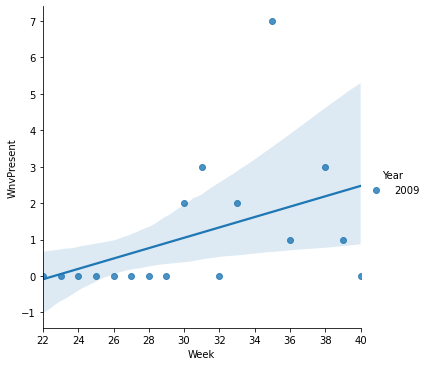

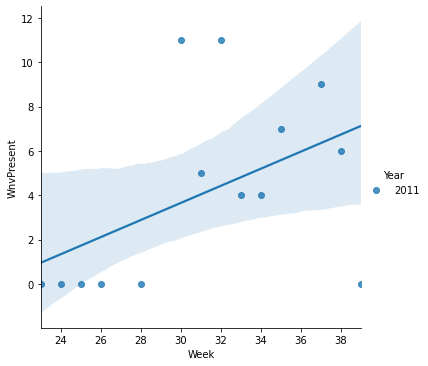

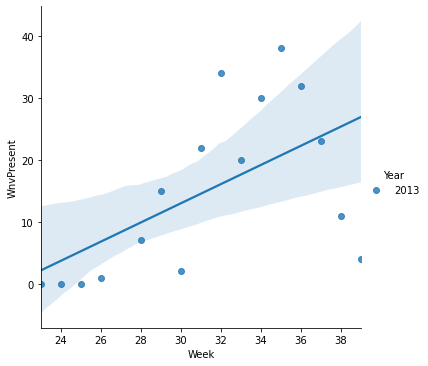

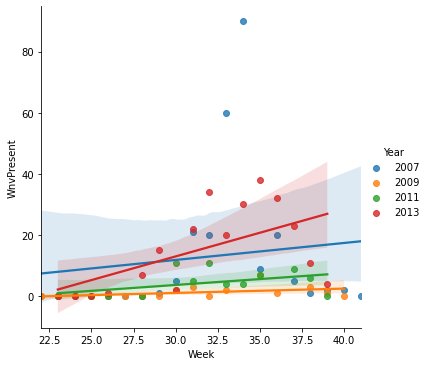

In [37]:
sns.lmplot(x='Week',y='WnvPresent', hue='Year', data=dftgroup_plt2007);
sns.lmplot(x='Week',y='WnvPresent', hue='Year', data=dftgroup_plt2009);
sns.lmplot(x='Week',y='WnvPresent', hue='Year', data=dftgroup_plt2011);
sns.lmplot(x='Week',y='WnvPresent', hue='Year', data=dftgroup_plt2013);
sns.lmplot(x='Week',y='WnvPresent', hue='Year', data=dftgroup_plt);

Plot Virus trend against years

1) 2013 seems to be the worst year hit with the most number of virus count

2) 2007 is the second worst year, followed by 2011 and 2009

## Spray Data

In [38]:
dfs.loc[dfs['Latitude']!=0,'Sprayed'] = 1

In [39]:
dfsgroup_plt = dfs.groupby(by=["Week", "Year"], dropna=False).sum().reset_index()

dfsgroup_plt2011 = dfsgroup_plt[dfsgroup_plt['Year']==2011] 
dfsgroup_plt2013 = dfsgroup_plt[dfsgroup_plt['Year']==2013] 

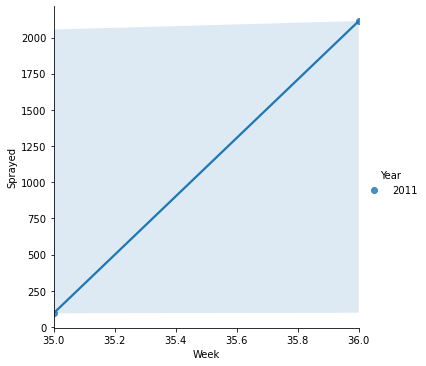

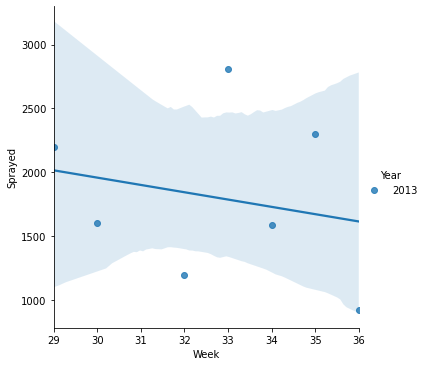

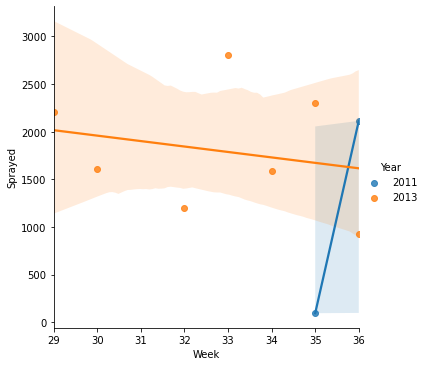

In [40]:
sns.lmplot(x='Week',y='Sprayed', hue='Year', data=dfsgroup_plt2011);
sns.lmplot(x='Week',y='Sprayed', hue='Year', data=dfsgroup_plt2013);
sns.lmplot(x='Week',y='Sprayed', hue='Year', data=dfsgroup_plt);

Spray occurred in two years 2011 and 2013

1) 2011 spray happened from week 35-36

2) 2013 spray happened from week 29-36

In [41]:
dfmerged = dftgroup_plt.append(dfs)

In [ ]:
dfmerged

In [ ]:
lats_spray = dfs.Latitude
longs_spray = dfs.Longitude
lats_train_0 = dft[dft['WnvPresent']==0].Latitude
longs_train_0 = dft[dft['WnvPresent']==0].Longitude
lats_train_1 = dft[dft['WnvPresent']==1].Latitude
longs_train_1 = dft[dft['WnvPresent']==1].Longitude

In [ ]:
mapdata = np.loadtxt("../assets/mapdata.txt")

origin = [41.6, -88.1]              # lat/long of origin (lower left corner)
upperRight = [42.4, -87.5]          # lat/long of upper right corner

# generate plot
plt.figure(figsize=(20,15))
plt.imshow(mapdata, cmap=plt.get_cmap('gray'), extent=[origin[1], upperRight[1], origin[0], upperRight[0]])
plt.scatter(x=longs_spray, y=lats_spray, c='y', s=5)
plt.scatter(x=longs_train_0, y=lats_train_0, c='g', s=30)
plt.scatter(x=longs_train_1, y=lats_train_1, c='r', s=30);
#plt.scatter(x=intersection[1], y=intersection[0], c='b', s=60, marker='s')

In [ ]:
dfs2011 = dfs[dfs['Year']==2011]
dft2011 = dft[dft['Year']==2011]

lats_spray2011 = dfs2011.Latitude
longs_spray2011 = dfs2011.Longitude
lats_train_0_2011 = dft2011[dft2011['WnvPresent']==0].Latitude
longs_train_0_2011 = dft2011[dft2011['WnvPresent']==0].Longitude
lats_train_1_2011 = dft2011[dft2011['WnvPresent']==1].Latitude
longs_train_1_2011 = dft2011[dft2011['WnvPresent']==1].Longitude

In [ ]:
dfs2011['Week'].value_counts(dropna=False, ascending=True)

In [ ]:
plt.figure(figsize=(20,15))
plt.imshow(mapdata, cmap=plt.get_cmap('gray'), extent=[origin[1], upperRight[1], origin[0], upperRight[0]])
plt.scatter(x=longs_spray2011, y=lats_spray2011, c='y', s=5)
plt.scatter(x=longs_train_0_2011, y=lats_train_0_2011, c='g', s=30)
plt.scatter(x=longs_train_1_2011, y=lats_train_1_2011, c='r', s=30);

In [ ]:
dfs2013 = dfs[dfs['Year']==2013]
dft2013 = dft[dft['Year']==2013]

lats_spray2013 = dfs2013.Latitude
longs_spray2013 = dfs2013.Longitude
lats_train_0_2013 = dft2013[dft2013['WnvPresent']==0].Latitude
longs_train_0_2013 = dft2013[dft2013['WnvPresent']==0].Longitude
lats_train_1_2013 = dft2013[dft2013['WnvPresent']==1].Latitude
longs_train_1_2013 = dft2013[dft2013['WnvPresent']==1].Longitude

In [ ]:
dfs2013['Week'].value_counts(dropna=False)

In [ ]:
plt.figure(figsize=(20,15))
plt.imshow(mapdata, cmap=plt.get_cmap('gray'), extent=[origin[1], upperRight[1], origin[0], upperRight[0]])
plt.scatter(x=longs_spray2013, y=lats_spray2013, c='y', s=5)
plt.scatter(x=longs_train_0_2013, y=lats_train_0_2013, c='g', s=30)
plt.scatter(x=longs_train_1_2013, y=lats_train_1_2013, c='r', s=30);

In [ ]:
dft2007 = dft[dft['Year']==2007]

lats_train_0_2007 = dft2007[dft2007['WnvPresent']==0].Latitude
longs_train_0_2007 = dft2007[dft2007['WnvPresent']==0].Longitude
lats_train_1_2007 = dft2007[dft2007['WnvPresent']==1].Latitude
longs_train_1_2007 = dft2007[dft2007['WnvPresent']==1].Longitude

In [ ]:
plt.figure(figsize=(20,15))
plt.imshow(mapdata, cmap=plt.get_cmap('gray'), extent=[origin[1], upperRight[1], origin[0], upperRight[0]])
plt.scatter(x=longs_train_0_2007, y=lats_train_0_2007, c='g', s=30)
plt.scatter(x=longs_train_1_2007, y=lats_train_1_2007, c='r', s=30);

In [ ]:
dft2009 = dft[dft['Year']==2009]

lats_train_0_2009 = dft2009[dft2009['WnvPresent']==0].Latitude
longs_train_0_2009 = dft2009[dft2009['WnvPresent']==0].Longitude
lats_train_1_2009 = dft2009[dft2009['WnvPresent']==1].Latitude
longs_train_1_2009 = dft2009[dft2009['WnvPresent']==1].Longitude

In [ ]:
plt.figure(figsize=(20,15))
plt.imshow(mapdata, cmap=plt.get_cmap('gray'), extent=[origin[1], upperRight[1], origin[0], upperRight[0]])
plt.scatter(x=longs_train_0_2009, y=lats_train_0_2009, c='g', s=30)
plt.scatter(x=longs_train_1_2009, y=lats_train_1_2009, c='r', s=30);

In [ ]:
dftgroup_plt2007 = dftgroup_plt[dftgroup_plt['Year']==2007].reset_index()
dftgroup_plt2009 = dftgroup_plt[dftgroup_plt['Year']==2009].reset_index()
dftgroup_plt2011 = dftgroup_plt[dftgroup_plt['Year']==2011].reset_index()
dftgroup_plt2013 = dftgroup_plt[dftgroup_plt['Year']==2013].reset_index()

In [ ]:
dftgroup_plt2007['moschg'] = dftgroup_plt2007['NumMosquitos'].pct_change(fill_method ='ffill')
dftgroup_plt2009['moschg'] = dftgroup_plt2009['NumMosquitos'].pct_change(fill_method ='ffill')
dftgroup_plt2011['moschg'] = dftgroup_plt2011['NumMosquitos'].pct_change(fill_method ='ffill')
dftgroup_plt2013['moschg'] = dftgroup_plt2013['NumMosquitos'].pct_change(fill_method ='ffill')

## Mosquito change per week 

In [ ]:
#dropping columns not used
dftgroup_plt2007.drop(columns=['index', 'Block', 'Latitude', 'Longitude', 'AddressAccuracy'], inplace=True)
dftgroup_plt2009.drop(columns=['index', 'Block', 'Latitude', 'Longitude', 'AddressAccuracy'], inplace=True)
dftgroup_plt2011.drop(columns=['index', 'Block', 'Latitude', 'Longitude', 'AddressAccuracy'], inplace=True)
dftgroup_plt2013.drop(columns=['index', 'Block', 'Latitude', 'Longitude', 'AddressAccuracy'], inplace=True)

In [ ]:
dftgroup_plt2007

In [ ]:
dftgroup_plt2009

In [ ]:
dftgroup_plt2011

In [ ]:
dftgroup_plt2013

In [ ]:
sns.lmplot(x='Week',y='moschg', hue='Year', data=dftgroup_plt2007);
sns.lmplot(x='Week',y='moschg', hue='Year', data=dftgroup_plt2009);
sns.lmplot(x='Week',y='moschg', hue='Year', data=dftgroup_plt2011);
sns.lmplot(x='Week',y='moschg', hue='Year', data=dftgroup_plt2013);

In [ ]:
dfs2011.groupby(by='Week').sum()

In [ ]:
dfs2013.groupby(by='Week').sum()

In [ ]:
dftgroup_spray2011 = dftgroup_plt2011.iloc[10:12]
dftgroup_spray2011

In [ ]:
dftgroup_spray2007 = dftgroup_plt2007.iloc[4:14]
dftgroup_spray2007

In [ ]:
dftgroup_spray2013 = dftgroup_plt2013.iloc[4:14]
dftgroup_spray2013

Spray seems to be effective in 2013 from week 29-36, by dropping the mosquito count from 3188 -> 1946. about -40% drop



In [ ]:
sns.lmplot(x='Week',y='moschg', hue='Year', data=dftgroup_spray2007);
sns.lmplot(x='Week',y='moschg', hue='Year', data=dftgroup_spray2013);

## Cost Benefit Analysis

In [ ]:
from scipy.stats import mannwhitneyu
results = mannwhitneyu(dftgroup_spray2013['moschg'], dftgroup_spray2007['moschg'])
results

A review of the vector management methods to prevent and control outbreaks of West Nile virus infection and the challenge for Europe
https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4230500/

Estimated that approximately USD 1.7 million was spent on 124 symptomatic cases in 2012 and USD 430,000 on 31 symptomatic cases

USD 1.7 million / 124 = USD 13,700
USD 430,000 / 31 = USD 13,870

Average of USD ~13700 cost per case 

A 20-year historical review of West Nile virus since its initial emergence in North America: Has West Nile virus become a neglected tropical disease?
https://journals.plos.org/plosntds/article?id=10.1371/journal.pntd.0009190

Cost USD 250,000 per year 
HBR Guide to Buying a Small Business: Think Big, Buy Small, Own Your Own Company (2017)

Cost of spraying/ cost per case :  
250000/13870 = 18

>At least 18 cases will have to be prevented to be worth spraying

## Conclusion

Spray seems to be effective in 2013 from week 29-36, 40% drop in number of mosquitoes. 

Spraying would be recommended : 

1) mosquitoes number > 1800 ( assuming west nile virus has a 10% correlation to number of mosquitoes)

2) spraying to be deployed before peak of mosquito season as it has an delayed effect in mosquitoes number

Once the transmission of virus is active, harder to bring the virus number down 

